Let's start playing for the first time with music files.

Thanks to Parul Pandey's blog post : https://towardsdatascience.com/music-genre-classification-with-python-c714d032f0d8

In [32]:
import numpy as np
import sklearn
import matplotlib.pyplot as plt

In [13]:
import librosa 
import librosa.display
import IPython.display as ipd

In [23]:
import seaborn as sns
sns.set()

In [34]:
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

### Path and load

In [8]:
audio_path = './data/choreo.mp3'
x , sr = librosa.load(audio_path, sr=None)

In [9]:
print(type(x), type(sr))
print(x.shape, sr)

<class 'numpy.ndarray'> <class 'int'>
(9071868,) 44100


#### Play !

In [11]:
ipd.Audio(audio_path)

#### Plot of the amplitude envelope of the audio array

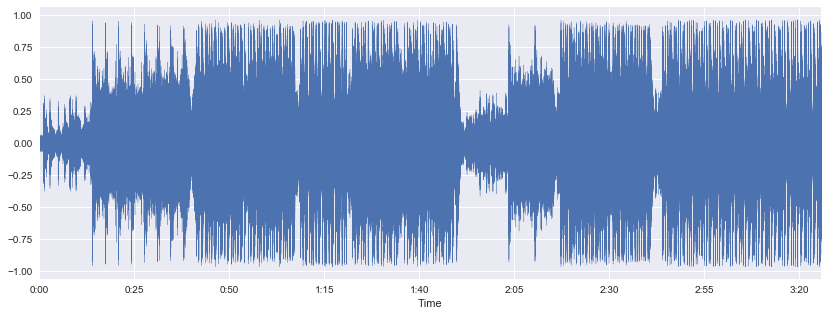

In [24]:
plt.figure(figsize=(14, 5))
librosa.display.waveplot(x, sr=sr)

#### Spectrogram

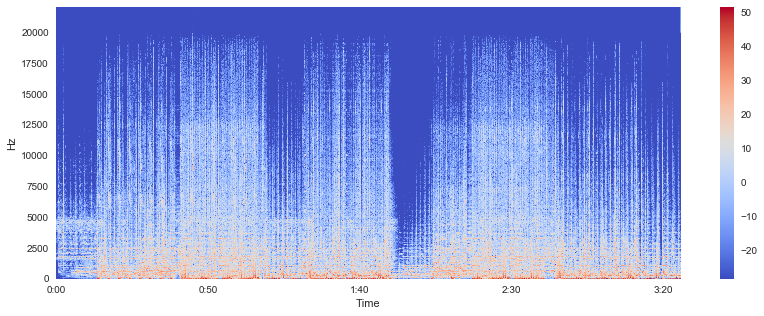

In [25]:
X = librosa.stft(x)
Xdb = librosa.amplitude_to_db(abs(X))
plt.figure(figsize=(14, 5))
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

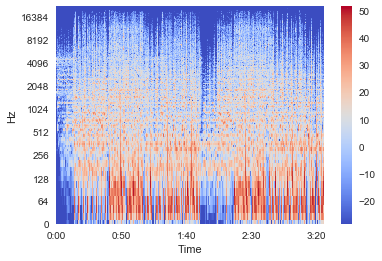

In [26]:
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

### Feature extraction
zoom

10


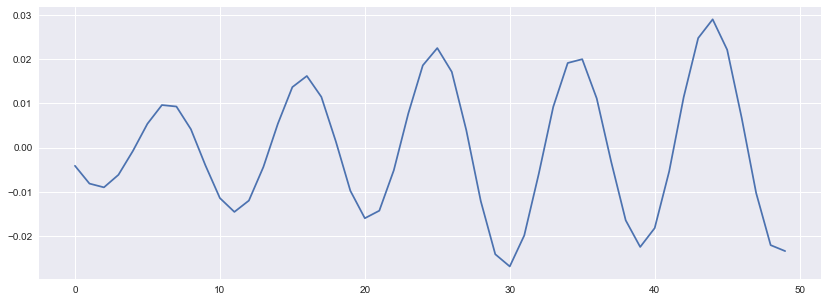

In [30]:
n0 = 9000
n1 = 9050
plt.figure(figsize=(14, 5))
plt.plot(x[n0:n1])

zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
print(sum(zero_crossings))

#### Spectral centroid

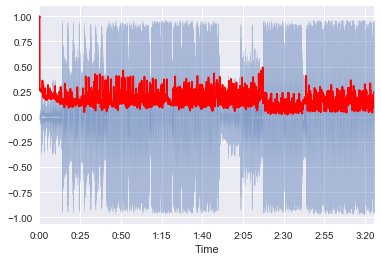

In [35]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape
(775,)
# Computing the time variable for visualization
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

#### Chroma frequency

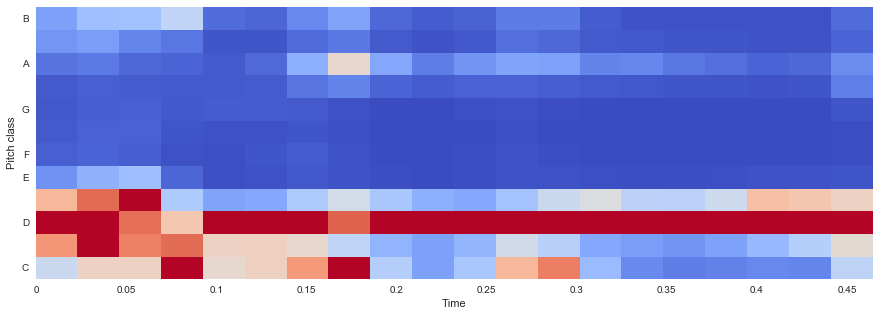

In [38]:
n0 = 0
n1 = 10000
hop_length = 512
chromagram = librosa.feature.chroma_stft(x[n0:n1], sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')